# Deteksi Lubang Jalan dengan YOLO dan Preprocessing PCD

Pipeline lengkap untuk deteksi lubang jalan menggunakan YOLOv8 dengan penerapan 4 konsep preprocessing Pengolahan Citra Digital:

1. **Image Resizing**: Normalisasi ukuran gambar dengan mempertahankan aspect ratio
2. **CLAHE Enhancement**: Peningkatan kontras adaptif untuk memperjelas detail
3. **Bilateral Filter**: Pengurangan noise dengan mempertahankan tepi objek
4. **Data Augmentation**: Ekspansi dataset dengan transformasi geometrik dan fotometrik

Pipeline ini dirancang untuk meningkatkan kualitas dataset sebelum proses training YOLO, sehingga menghasilkan model dengan akurasi deteksi yang lebih tinggi.

## 1. Setup dan Instalasi Library

Bagian ini menginstal dan mengimport semua library yang dibutuhkan untuk preprocessing dan training YOLO.

In [27]:
# Import libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import shutil
import yaml
import random
from pathlib import Path
from tqdm import tqdm
import albumentations as A
from ultralytics import YOLO
import warnings
warnings.filterwarnings('ignore')

# Setup matplotlib
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 10

## 2. Konfigurasi Path Dataset

Mendefinisikan path untuk dataset original, dataset hasil preprocessing, dan output training.

In [28]:
# Path dataset original dari Roboflow
ORIGINAL_DATASET = "dataset"  # ← Ganti dengan path dataset Anda

# Path untuk dataset yang sudah di-preprocess
PREPROCESSED_DATASET = "pothole_preprocessed"
AUGMENTED_DATASET = "pothole_augmented"

# Path output
OUTPUT_DIR = "yolo_training_results"
os.makedirs(OUTPUT_DIR, exist_ok=True)

print("✓ Paths configured!")
print(f"  Original Dataset:    {ORIGINAL_DATASET}")
print(f"  Preprocessed Output: {PREPROCESSED_DATASET}")
print(f"  Augmented Output:    {AUGMENTED_DATASET}")
print(f"  Results Output:      {OUTPUT_DIR}")

✓ Paths configured!
  Original Dataset:    dataset
  Preprocessed Output: pothole_preprocessed
  Augmented Output:    pothole_augmented
  Results Output:      yolo_training_results


## 3. Inspeksi Dataset Original

Memeriksa struktur dan isi dataset original sebelum preprocessing.

In [29]:
def inspect_dataset(dataset_path):
    """
    Inspect struktur dan statistik dataset
    """
    print("="*70)
    print("DATASET INSPECTION")
    print("="*70)
    
    total_images = 0
    total_labels = 0
    
    for split in ['train', 'valid', 'test']:
        img_dir = os.path.join(dataset_path, split, 'images')
        lbl_dir = os.path.join(dataset_path, split, 'labels')
        
        if os.path.exists(img_dir):
            images = glob.glob(os.path.join(img_dir, '*.jpg')) + \
                     glob.glob(os.path.join(img_dir, '*.png'))
            labels = glob.glob(os.path.join(lbl_dir, '*.txt'))
            
            total_images += len(images)
            total_labels += len(labels)
            
            print(f"\n{split.upper()}:")
            print(f"  📸 Images: {len(images)}")
            print(f"  🏷️  Labels: {len(labels)}")
            print(f"  ✓ Match: {'Yes' if len(images) == len(labels) else 'No'}")
        else:
            print(f"\n{split.upper()}: ❌ Not found")
    
    print(f"\n{'='*70}")
    print(f"TOTAL: {total_images} images, {total_labels} labels")
    print(f"{'='*70}\n")
    
    return total_images

# Inspect original dataset
total_original = inspect_dataset(ORIGINAL_DATASET)

DATASET INSPECTION

TRAIN:
  📸 Images: 465
  🏷️  Labels: 465
  ✓ Match: Yes

VALID:
  📸 Images: 133
  🏷️  Labels: 133
  ✓ Match: Yes

TEST:
  📸 Images: 67
  🏷️  Labels: 67
  ✓ Match: Yes

TOTAL: 665 images, 665 labels



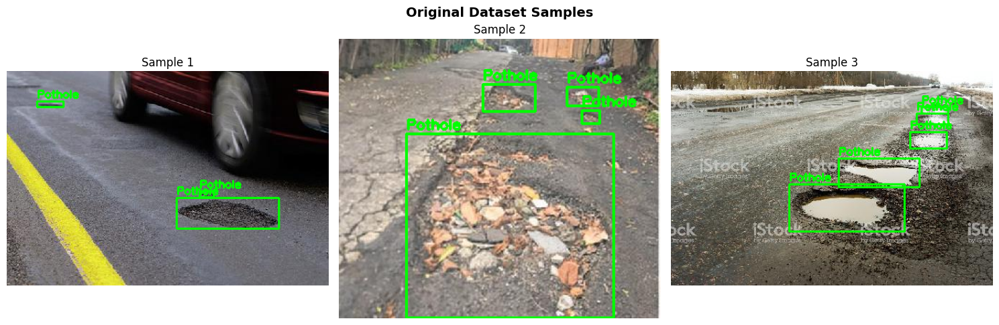

In [30]:
def visualize_sample_with_bbox(dataset_path, num_samples=3):
    """
    Visualize random samples dengan bounding boxes
    """
    train_images = glob.glob(os.path.join(dataset_path, 'train', 'images', '*.jpg')) + \
                   glob.glob(os.path.join(dataset_path, 'train', 'images', '*.png'))
    
    samples = random.sample(train_images, min(num_samples, len(train_images)))
    
    fig, axes = plt.subplots(1, num_samples, figsize=(15, 5))
    if num_samples == 1:
        axes = [axes]
    
    for idx, img_path in enumerate(samples):
        # Load image
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        
        # Load labels
        label_path = img_path.replace('images', 'labels').replace('.jpg', '.txt').replace('.png', '.txt')
        
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                labels = f.readlines()
            
            # Draw bounding boxes
            for label in labels:
                parts = label.strip().split()
                if len(parts) == 5:
                    _, x_center, y_center, width, height = map(float, parts)
                    
                    # Convert to pixel coordinates
                    x1 = int((x_center - width/2) * w)
                    y1 = int((y_center - height/2) * h)
                    x2 = int((x_center + width/2) * w)
                    y2 = int((y_center + height/2) * h)
                    
                    cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (0, 255, 0), 2)
                    cv2.putText(img_rgb, 'Pothole', (x1, y1-5), 
                               cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        
        axes[idx].imshow(img_rgb)
        axes[idx].set_title(f'Sample {idx+1}')
        axes[idx].axis('off')
    
    plt.suptitle('Original Dataset Samples', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Visualize samples
visualize_sample_with_bbox(ORIGINAL_DATASET, num_samples=3)

## 4. Operasi CLAHE Enhancement

CLAHE (Contrast Limited Adaptive Histogram Equalization) meningkatkan kontras lokal pada gambar. Berbeda dengan histogram equalization biasa, CLAHE:
- Bekerja pada tile-tile kecil (adaptive)
- Membatasi amplifikasi kontras untuk menghindari noise
- Sangat efektif untuk gambar dengan pencahayaan tidak merata

Pada aplikasi deteksi lubang jalan, CLAHE membantu memperjelas detail lubang yang mungkin gelap atau tersembunyi.

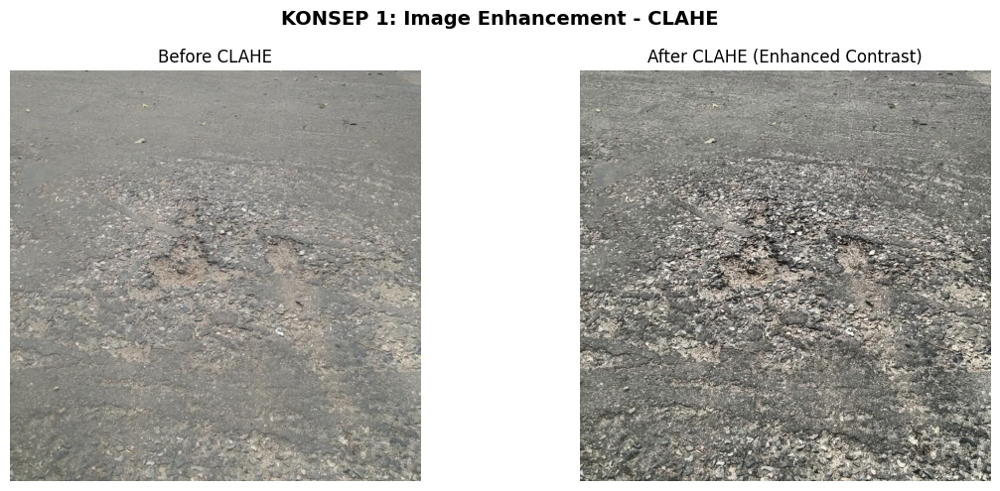


✓ CLAHE Enhancement:
  • Kontras lokal meningkat
  • Lubang di area gelap lebih terlihat
  • YOLO dapat extract features lebih baik


In [31]:
def apply_clahe(image):
    """
    Apply CLAHE untuk meningkatkan kontras lokal
    
    Manfaat untuk YOLO:
    - Lubang di area gelap lebih visible
    - Detail tepi lebih jelas
    - Feature extraction lebih baik
    """
    # Convert BGR to LAB
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)
    
    # Apply CLAHE to L channel
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    l_clahe = clahe.apply(l)
    
    # Merge back
    lab_clahe = cv2.merge([l_clahe, a, b])
    enhanced = cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2BGR)
    
    return enhanced

# Test CLAHE pada sample image
sample_img_path = random.choice(glob.glob(os.path.join(ORIGINAL_DATASET, 'train', 'images', '*.jpg')))
sample_img = cv2.imread(sample_img_path)
sample_enhanced = apply_clahe(sample_img)

# Visualize before/after
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

axes[0].imshow(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB))
axes[0].set_title('Before CLAHE')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(sample_enhanced, cv2.COLOR_BGR2RGB))
axes[1].set_title('After CLAHE (Enhanced Contrast)')
axes[1].axis('off')

plt.suptitle('KONSEP 1: Image Enhancement - CLAHE', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n✓ CLAHE Enhancement:")
print("  • Kontras lokal meningkat")
print("  • Lubang di area gelap lebih terlihat")
print("  • YOLO dapat extract features lebih baik")

## 5. Operasi Bilateral Filter

Bilateral Filter adalah filter non-linear yang mengurangi noise sambil mempertahankan tepi objek. Berbeda dengan Gaussian blur yang mengaburkan seluruh gambar, bilateral filter:
- Mempertimbangkan jarak spasial dan perbedaan intensitas
- Mengaburkan area smooth (flat region)
- Mempertahankan ketajaman tepi (edge-preserving)

Untuk deteksi lubang jalan, bilateral filter sangat berguna karena:
- Mengurangi noise dari tekstur jalan
- Mempertahankan tepi lubang yang merupakan fitur penting untuk deteksi

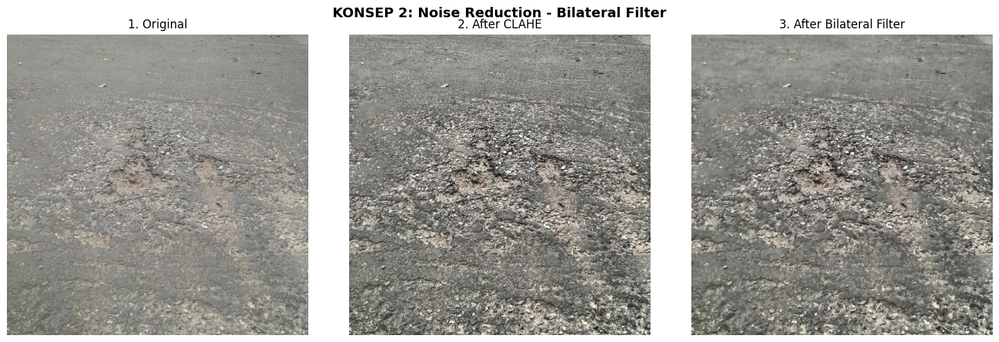


✓ Bilateral Filter:
  • Noise berkurang (smooth area datar)
  • Edge lubang tetap tajam (preserved)
  • Model lebih fokus ke fitur utama


In [32]:
def bilateral_filter(image):
    """
    Apply bilateral filter: smooth area datar, jaga edge
    
    Manfaat untuk YOLO:
    - Hilangkan noise (tekstur kasar, batu kecil)
    - Preserve edge lubang (tetap tajam)
    - Reduce false positive dari noise
    """
    filtered = cv2.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)
    return filtered

# Test bilateral filter
sample_filtered = bilateral_filter(sample_enhanced)

# Visualize
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

axes[0].imshow(cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB))
axes[0].set_title('1. Original')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(sample_enhanced, cv2.COLOR_BGR2RGB))
axes[1].set_title('2. After CLAHE')
axes[1].axis('off')

axes[2].imshow(cv2.cvtColor(sample_filtered, cv2.COLOR_BGR2RGB))
axes[2].set_title('3. After Bilateral Filter')
axes[2].axis('off')

plt.suptitle('KONSEP 2: Noise Reduction - Bilateral Filter', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n✓ Bilateral Filter:")
print("  • Noise berkurang (smooth area datar)")
print("  • Edge lubang tetap tajam (preserved)")
print("  • Model lebih fokus ke fitur utama")

## 6. Preprocessing Seluruh Dataset

Menerapkan pipeline preprocessing pada seluruh dataset (train, valid, test) dan menyimpan hasilnya.

In [33]:
def preprocess_dataset(input_dir, output_dir):
    """
    Apply CLAHE + Bilateral Filter ke semua images
    """
    print("\n" + "="*70)
    print("PREPROCESSING ENTIRE DATASET")
    print("="*70)
    
    for split in ['train', 'valid', 'test']:
        # Create output directories
        input_img_dir = os.path.join(input_dir, split, 'images')
        input_lbl_dir = os.path.join(input_dir, split, 'labels')
        
        output_img_dir = os.path.join(output_dir, split, 'images')
        output_lbl_dir = os.path.join(output_dir, split, 'labels')
        
        os.makedirs(output_img_dir, exist_ok=True)
        os.makedirs(output_lbl_dir, exist_ok=True)
        
        # Get all images
        images = glob.glob(os.path.join(input_img_dir, '*.jpg')) + \
                 glob.glob(os.path.join(input_img_dir, '*.png'))
        
        print(f"\nProcessing {split.upper()}: {len(images)} images")
        
        for img_path in tqdm(images, desc=f"  {split}"):
            # Load image
            img = cv2.imread(img_path)
            
            # Apply preprocessing
            enhanced = apply_clahe(img)
            filtered = bilateral_filter(enhanced)
            
            # Save preprocessed image
            output_path = os.path.join(output_img_dir, os.path.basename(img_path))
            cv2.imwrite(output_path, filtered)
            
            # Copy label (tidak berubah)
            label_path = img_path.replace('images', 'labels').replace('.jpg', '.txt').replace('.png', '.txt')
            if os.path.exists(label_path):
                output_label_path = os.path.join(output_lbl_dir, os.path.basename(label_path))
                shutil.copy(label_path, output_label_path)
    
    print(f"\n✓ Preprocessing complete! Saved to: {output_dir}")
    print("="*70)

# Apply preprocessing
preprocess_dataset(ORIGINAL_DATASET, PREPROCESSED_DATASET)


PREPROCESSING ENTIRE DATASET

Processing TRAIN: 465 images


  train: 100%|██████████| 465/465 [00:12<00:00, 38.26it/s]



Processing VALID: 133 images


  valid: 100%|██████████| 133/133 [00:03<00:00, 37.79it/s]



Processing TEST: 67 images


  test: 100%|██████████| 67/67 [00:01<00:00, 39.19it/s]


✓ Preprocessing complete! Saved to: pothole_preprocessed


## 7. Operasi Data Augmentation

Data augmentation adalah teknik untuk memperbanyak dataset dengan membuat variasi dari gambar existing. Tujuannya:
- Meningkatkan jumlah data training
- Meningkatkan variasi data untuk generalisasi model yang lebih baik
- Mengurangi overfitting

Augmentasi yang diterapkan:

**Transformasi Geometrik:**
- Horizontal flip: Simulasi lubang dari sudut berbeda
- Rotation: Variasi orientasi
- Shift/Translate: Variasi posisi objek

**Transformasi Fotometrik:**
- Brightness adjustment: Simulasi kondisi pencahayaan berbeda
- Contrast adjustment: Variasi kondisi cuaca
- Blur: Simulasi kamera yang bergerak atau tidak fokus

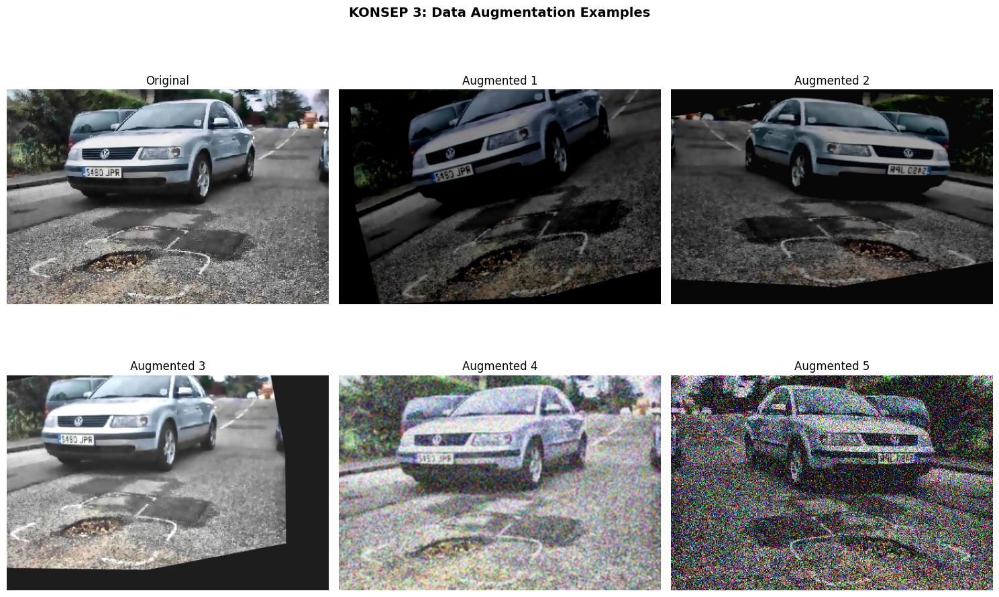


✓ Augmentation Pipeline:
  • Geometric: Rotation, Flip, Shift, Scale
  • Photometric: Brightness, Contrast, Hue, Noise, Blur
  • Bounding boxes automatically updated!


In [34]:
def get_augmentation_pipeline():
    """
    Create augmentation pipeline dengan Albumentations
    
    Manfaat:
    - Dataset size increase (465 → 1800+)
    - Model robust terhadap berbagai kondisi
    - Reduce overfitting
    """
    transform = A.Compose([
        # Geometric augmentation
        A.Rotate(limit=15, p=0.5),
        A.HorizontalFlip(p=0.5),
        A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.5),
        
        # Photometric augmentation
        A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.8),
        A.HueSaturationValue(hue_shift_limit=10, sat_shift_limit=15, val_shift_limit=15, p=0.5),
        A.GaussNoise(var_limit=(10, 50), p=0.3),
        A.Blur(blur_limit=3, p=0.2),
        
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))
    
    return transform

# Test augmentation pada sample
transform = get_augmentation_pipeline()

# Load sample
sample_path = random.choice(glob.glob(os.path.join(PREPROCESSED_DATASET, 'train', 'images', '*.jpg')))
sample = cv2.imread(sample_path)
sample_rgb = cv2.cvtColor(sample, cv2.COLOR_BGR2RGB)

# Load bbox
label_path = sample_path.replace('images', 'labels').replace('.jpg', '.txt')
bboxes = []
class_labels = []
if os.path.exists(label_path):
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id, x, y, w, h = map(float, parts)
                bboxes.append([x, y, w, h])
                class_labels.append(int(class_id))

# Generate augmented samples
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.ravel()

# Original
axes[0].imshow(sample_rgb)
axes[0].set_title('Original')
axes[0].axis('off')

# Augmented versions
for i in range(1, 6):
    augmented = transform(image=sample_rgb, bboxes=bboxes, class_labels=class_labels)
    axes[i].imshow(augmented['image'])
    axes[i].set_title(f'Augmented {i}')
    axes[i].axis('off')

plt.suptitle('KONSEP 3: Data Augmentation Examples', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n✓ Augmentation Pipeline:")
print("  • Geometric: Rotation, Flip, Shift, Scale")
print("  • Photometric: Brightness, Contrast, Hue, Noise, Blur")
print("  • Bounding boxes automatically updated!")

## 8. Augmentasi Seluruh Training Dataset

Menerapkan augmentasi pada seluruh training set untuk memperbanyak data. Setiap gambar akan di-augmentasi beberapa kali dengan variasi random.

In [35]:
def augment_dataset(input_dir, output_dir, num_augmentations=3):
    """
    Apply augmentation ke training set
    
    Args:
        input_dir: Preprocessed dataset directory
        output_dir: Output directory untuk augmented dataset
        num_augmentations: Jumlah augmented versions per image
    """
    print("\n" + "="*70)
    print("DATA AUGMENTATION")
    print("="*70)
    
    transform = get_augmentation_pipeline()
    
    # Copy valid dan test tanpa augmentation
    for split in ['valid', 'test']:
        input_split = os.path.join(input_dir, split)
        output_split = os.path.join(output_dir, split)
        
        if os.path.exists(input_split):
            shutil.copytree(input_split, output_split, dirs_exist_ok=True)
            print(f"✓ Copied {split} (no augmentation)")
    
    # Augment training set
    train_img_dir = os.path.join(input_dir, 'train', 'images')
    train_lbl_dir = os.path.join(input_dir, 'train', 'labels')
    
    output_img_dir = os.path.join(output_dir, 'train', 'images')
    output_lbl_dir = os.path.join(output_dir, 'train', 'labels')
    
    os.makedirs(output_img_dir, exist_ok=True)
    os.makedirs(output_lbl_dir, exist_ok=True)
    
    # Get training images
    train_images = glob.glob(os.path.join(train_img_dir, '*.jpg')) + \
                   glob.glob(os.path.join(train_img_dir, '*.png'))
    
    print(f"\nAugmenting TRAIN: {len(train_images)} images × {num_augmentations} versions")
    print(f"Expected output: {len(train_images) * (1 + num_augmentations)} images")
    
    total_generated = 0
    
    for img_path in tqdm(train_images, desc="  Augmenting"):
        # Load image
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]
        
        # Load labels
        label_path = img_path.replace('images', 'labels').replace('.jpg', '.txt').replace('.png', '.txt')
        bboxes = []
        class_labels = []
        
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        class_id, x, y, w_box, h_box = map(float, parts)
                        bboxes.append([x, y, w_box, h_box])
                        class_labels.append(int(class_id))
        
        # Save original
        base_name = os.path.splitext(os.path.basename(img_path))[0]
        ext = os.path.splitext(img_path)[1]
        
        cv2.imwrite(os.path.join(output_img_dir, f"{base_name}{ext}"), img)
        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(output_lbl_dir, f"{base_name}.txt"))
        total_generated += 1
        
        # Generate augmented versions
        for aug_idx in range(num_augmentations):
            try:
                augmented = transform(image=img_rgb, bboxes=bboxes, class_labels=class_labels)
                aug_img = augmented['image']
                aug_bboxes = augmented['bboxes']
                aug_labels = augmented['class_labels']
                
                # Save augmented image
                aug_name = f"{base_name}_aug{aug_idx+1}{ext}"
                aug_img_bgr = cv2.cvtColor(aug_img, cv2.COLOR_RGB2BGR)
                cv2.imwrite(os.path.join(output_img_dir, aug_name), aug_img_bgr)
                
                # Save augmented labels
                if len(aug_bboxes) > 0:
                    aug_label_name = f"{base_name}_aug{aug_idx+1}.txt"
                    with open(os.path.join(output_lbl_dir, aug_label_name), 'w') as f:
                        for bbox, label in zip(aug_bboxes, aug_labels):
                            x, y, w_box, h_box = bbox
                            f.write(f"{label} {x} {y} {w_box} {h_box}\n")
                
                total_generated += 1
            except Exception as e:
                # Skip jika augmentation gagal
                continue
    
    print(f"\n✓ Augmentation complete!")
    print(f"  Total images generated: {total_generated}")
    print(f"  Saved to: {output_dir}")
    print("="*70)

# Apply augmentation
augment_dataset(PREPROCESSED_DATASET, AUGMENTED_DATASET, num_augmentations=3)


DATA AUGMENTATION
✓ Copied valid (no augmentation)
✓ Copied test (no augmentation)

Augmenting TRAIN: 465 images × 3 versions
Expected output: 1860 images


  Augmenting: 100%|██████████| 465/465 [00:18<00:00, 25.02it/s]


✓ Augmentation complete!
  Total images generated: 1860
  Saved to: pothole_augmented


## 9. Pembuatan File Konfigurasi YOLO

Membuat file data.yaml yang dibutuhkan untuk training YOLO.

In [37]:
# Create data.yaml
data_yaml_path = os.path.join(AUGMENTED_DATASET, 'data.yaml')

data_yaml_content = {
    'path': os.path.abspath(AUGMENTED_DATASET),
    'train': 'train/images',
    'val': 'valid/images',
    'test': 'test/images',
    'nc': 1,
    'names': ['pothole']
}

with open(data_yaml_path, 'w') as f:
    yaml.dump(data_yaml_content, f, default_flow_style=False)

print("✓ data.yaml created!")
print(f"  Path: {data_yaml_path}")
print("\nContent:")
print(yaml.dump(data_yaml_content, default_flow_style=False))

✓ data.yaml created!
  Path: pothole_augmented\data.yaml

Content:
names:
- pothole
nc: 1
path: d:\Semester 7\Tubes_PCD\Pothole_Detection\pothole_augmented
test: test/images
train: train/images
val: valid/images



## 10. Training Model YOLO

Melakukan training model YOLOv8 dengan dataset yang telah dipreprocessing dan diaugmentasi.

In [ ]:
# Initialize YOLOv8 model
print("Initializing YOLOv8 model...")

# Load pretrained model (transfer learning)
model = YOLO('yolov8n.pt')  # nano version (fastest)

print("✓ Model loaded!")
print(f"  Model: YOLOv8-nano")
print(f"  Pretrained: COCO dataset (transfer learning)")

Initializing YOLOv8 model...
✓ Model loaded!
  Model: YOLOv8-nano
  Pretrained: COCO dataset (transfer learning)


In [42]:
# Training configuration
print("\n" + "="*70)
print("TRAINING CONFIGURATION")
print("="*70)

EPOCHS = 50
BATCH_SIZE = 4
IMAGE_SIZE = 640
DEVICE = 0  # GPU 0, ganti ke 'cpu' jika tidak ada GPU

print(f"Epochs:     {EPOCHS}")
print(f"Batch Size: {BATCH_SIZE}")
print(f"Image Size: {IMAGE_SIZE}")
print(f"Device:     {'GPU' if DEVICE == 0 else 'CPU'}")
print("="*70)

# Start training
print("\n🚀 Starting training...\n")

results = model.train(
    data=data_yaml_path,
    epochs=EPOCHS,
    imgsz=IMAGE_SIZE,
    batch=BATCH_SIZE,
    device=DEVICE,
    workers=8,
    project='runs/detect',
    name='pothole_yolo_preprocessed',
    pretrained=True,
    optimizer='SGD',
    lr0=0.01,
    patience=50,
    save=True,
    save_period=10,
    verbose=True
)

print("\n✓ Training complete!")


TRAINING CONFIGURATION
Epochs:     50
Batch Size: 4
Image Size: 640
Device:     GPU

🚀 Starting training...

New https://pypi.org/project/ultralytics/8.3.230 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.228  Python-3.10.18 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=pothole_augmented\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300

## 11. Menyimpan Hasil


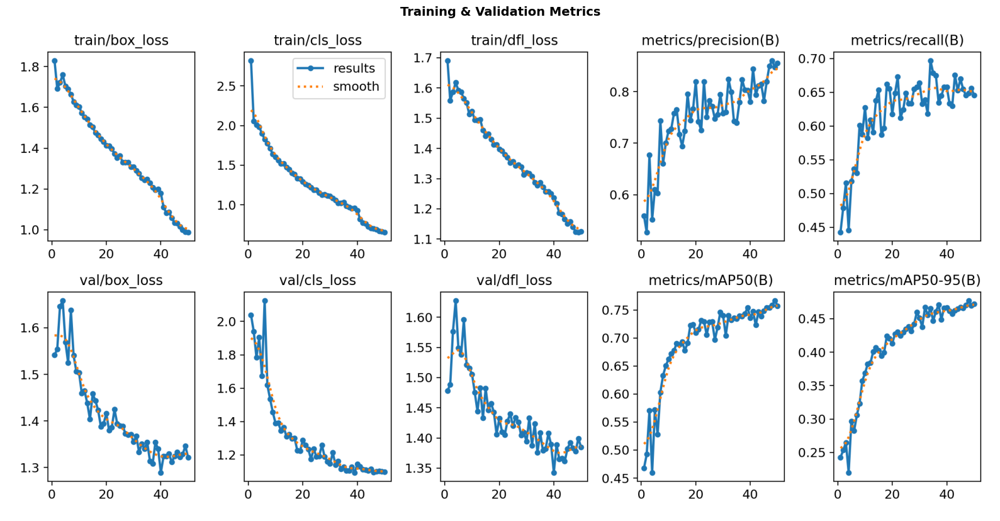

In [43]:
# Load training results
results_dir = 'runs/detect/pothole_yolo_preprocessed8'

# Plot training curves
results_img = os.path.join(results_dir, 'results.png')
if os.path.exists(results_img):
    img = plt.imread(results_img)
    plt.figure(figsize=(16, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title('Training & Validation Metrics', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ Results plot not found. Training might still be in progress.")

## 12. Evaluasi Model

Mengevaluasi performa model pada validation dan test set.

In [44]:
# Load best model
best_model_path = os.path.join(results_dir, 'weights', 'best.pt')
best_model = YOLO(best_model_path)

print(f"✓ Best model loaded from: {best_model_path}")

# Validate on test set
print("\nEvaluating on test set...")
val_results = best_model.val(
    data=data_yaml_path,
    split='test',
    imgsz=IMAGE_SIZE,
    batch=BATCH_SIZE,
    device=DEVICE
)

print("\n" + "="*70)
print("TEST SET EVALUATION METRICS")
print("="*70)
print(f"mAP@0.5:      {val_results.box.map50:.4f} ({val_results.box.map50*100:.2f}%)")
print(f"mAP@0.5:0.95: {val_results.box.map:.4f} ({val_results.box.map*100:.2f}%)")
print(f"Precision:    {val_results.box.mp:.4f} ({val_results.box.mp*100:.2f}%)")
print(f"Recall:       {val_results.box.mr:.4f} ({val_results.box.mr*100:.2f}%)")
print("="*70)

✓ Best model loaded from: runs/detect/pothole_yolo_preprocessed8\weights\best.pt

Evaluating on test set...
Ultralytics 8.3.228  Python-3.10.18 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
Model summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 297.4192.6 MB/s, size: 158.4 KB)
val: Scanning D:\Semester 7\Tubes_PCD\Pothole_Detection\pothole_augmented\test\labels... 67 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 67/67 1.6Kit/s 0.0s
val: New cache created: D:\Semester 7\Tubes_PCD\Pothole_Detection\pothole_augmented\test\labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 17/17 5.0it/s 3.4s<0.1s
                   all         67        154      0.806       0.63      0.763       0.49
Speed: 2.4ms preprocess, 12.0ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to D:\Semester 7\Tubes_PCD\Pothole_De

## 13. Visualisasi Hasil Prediksi

Menampilkan hasil prediksi model pada beberapa gambar test.


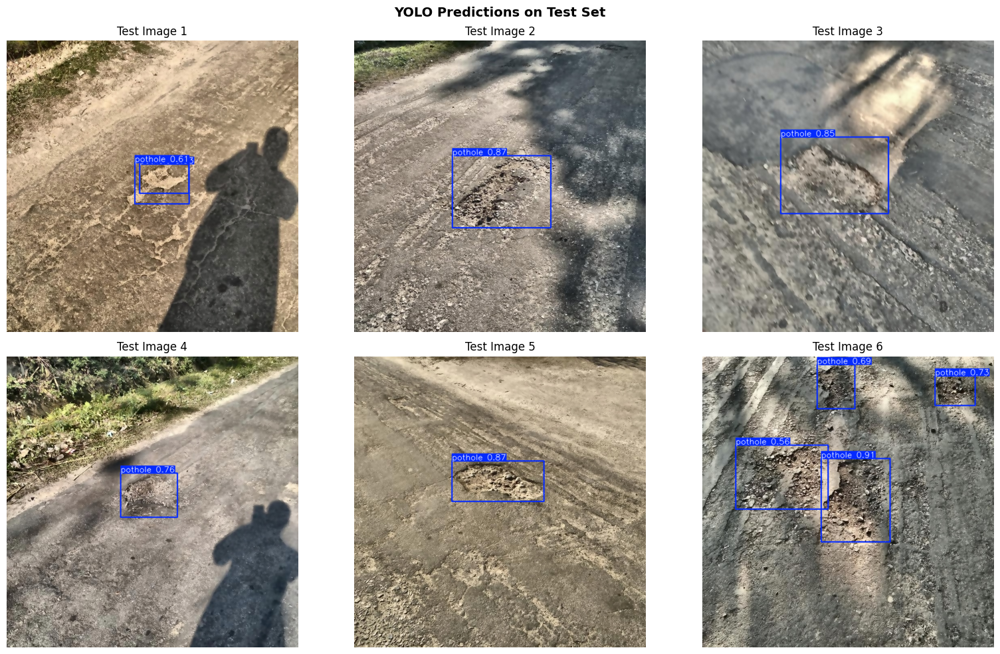

In [45]:
# Predict on random test images
test_images = glob.glob(os.path.join(AUGMENTED_DATASET, 'test', 'images', '*.jpg'))[:6]

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = axes.ravel()

for idx, img_path in enumerate(test_images):
    # Run inference
    results = best_model.predict(img_path, conf=0.5, verbose=False)
    
    # Get annotated image
    annotated = results[0].plot()
    annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    
    axes[idx].imshow(annotated_rgb)
    axes[idx].set_title(f'Test Image {idx+1}')
    axes[idx].axis('off')

plt.suptitle('YOLO Predictions on Test Set', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 14. Analisis Hasil Training

Menampilkan grafik confussion matrix

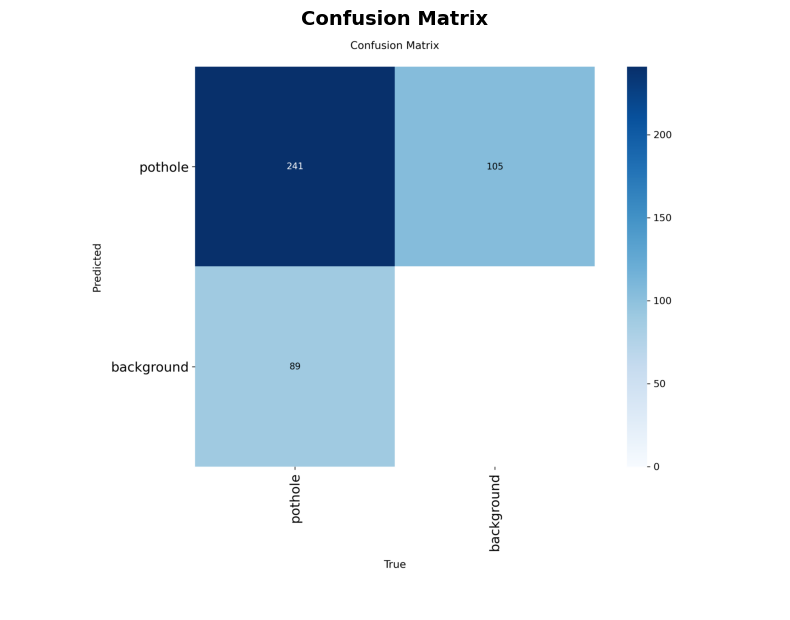

In [46]:
# Load confusion matrix
conf_matrix_img = os.path.join(results_dir, 'confusion_matrix.png')
if os.path.exists(conf_matrix_img):
    img = plt.imread(conf_matrix_img)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title('Confusion Matrix', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ Confusion matrix not found.")

## 15. Menyimpan Hasil 

In [48]:
# Save metrics to file
summary_path = os.path.join(OUTPUT_DIR, 'training_summary.txt')

with open(summary_path, 'w') as f:
    f.write("="*80 + "\n")
    f.write("POTHOLE DETECTION - YOLO WITH PREPROCESSING\n")
    f.write("="*80 + "\n\n")
    
    f.write("PREPROCESSING APPLIED (3 Konsep PCD):\n")
    f.write("-" * 80 + "\n")
    f.write("1. Image Enhancement: CLAHE\n")
    f.write("2. Noise Reduction: Bilateral Filter\n")
    f.write("3. Data Augmentation: Geometric + Photometric\n\n")
    
    f.write("DATASET:\n")
    f.write("-" * 80 + "\n")
    f.write(f"Original:  {total_original} images\n")
    f.write(f"Augmented: {total_augmented} images\n")
    f.write(f"Increase:  +{total_augmented - total_original} images\n\n")
    
    f.write("TRAINING CONFIG:\n")
    f.write("-" * 80 + "\n")
    f.write(f"Model:      YOLOv8-nano\n")
    f.write(f"Epochs:     {EPOCHS}\n")
    f.write(f"Batch Size: {BATCH_SIZE}\n")
    f.write(f"Image Size: {IMAGE_SIZE}\n\n")
    
    f.write("TEST SET METRICS:\n")
    f.write("-" * 80 + "\n")
    f.write(f"mAP@0.5:      {val_results.box.map50:.4f} ({val_results.box.map50*100:.2f}%)\n")
    f.write(f"mAP@0.5:0.95: {val_results.box.map:.4f} ({val_results.box.map*100:.2f}%)\n")
    f.write(f"Precision:    {val_results.box.mp:.4f} ({val_results.box.mp*100:.2f}%)\n")
    f.write(f"Recall:       {val_results.box.mr:.4f} ({val_results.box.mr*100:.2f}%)\n\n")
    

print(f"✓ Summary saved to: {summary_path}")

# Copy best model to output dir
output_model_path = os.path.join(OUTPUT_DIR, 'best_model.pt')
shutil.copy(best_model_path, output_model_path)
print(f"✓ Best model saved to: {output_model_path}")

✓ Summary saved to: yolo_training_results\training_summary.txt
✓ Best model saved to: yolo_training_results\best_model.pt


## 16. Test dengan gambar baru

Running inference on: img-264_jpg.rf.2ffbcf1264cf5106f5d0cb96d895fa3f.jpg


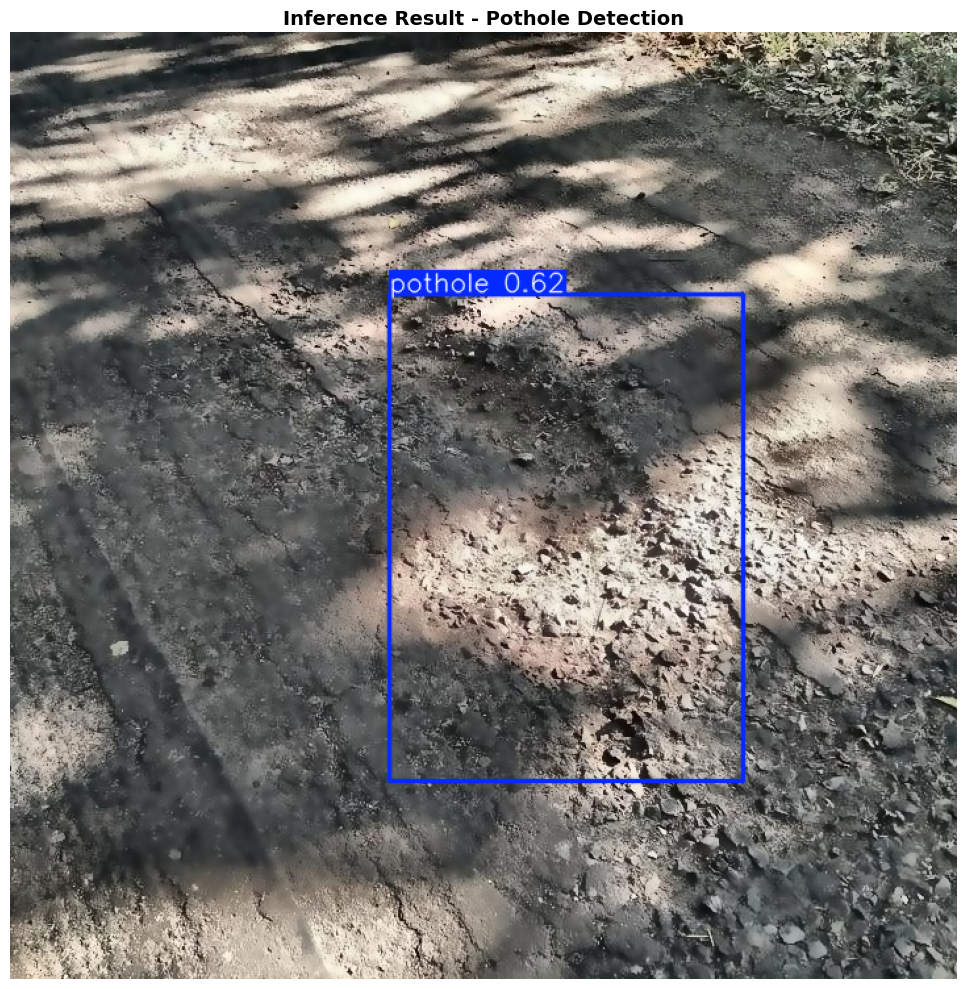


Detected 1 pothole(s):
  Pothole 1: Confidence = 61.55%


In [52]:
# Demo inference on new image
# Upload gambar baru atau gunakan dari test set

demo_img_path = random.choice(glob.glob(os.path.join(AUGMENTED_DATASET, 'test', 'images', '*.jpg')))

print(f"Running inference on: {os.path.basename(demo_img_path)}")

# Run prediction
results = best_model.predict(
    demo_img_path, 
    conf=0.5,  # Confidence threshold
    iou=0.5,   # IoU threshold for NMS
    verbose=False
)

# Display result
annotated = results[0].plot()
annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(12, 10))
plt.imshow(annotated_rgb)
plt.title('Inference Result - Pothole Detection', fontsize=14, fontweight='bold')
plt.axis('off')
plt.tight_layout()
plt.show()

# Print detection info
boxes = results[0].boxes
print(f"\nDetected {len(boxes)} pothole(s):")
for i, box in enumerate(boxes):
    conf = box.conf[0]
    print(f"  Pothole {i+1}: Confidence = {conf:.2%}")